# Figure 4

Calculate and plot backscatter differences between successive Sentinel-1 images.
All data collected from same relative orbit number (ron).


In [1]:
# imports
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mticker
import geopandas as gpd
import os
import rioxarray as rxr
from datetime import datetime

# scalebar
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

# set some universal plot settings here
plt.rcParams["figure.dpi"] = 300
plt.rcParams['font.family'] = 'Helvetica'
%config InlineBackend.figure_format = 'retina' # make high res plots for retina 5k displays

In [2]:
# get data
shoreline = gpd.read_file('Contour_20040107.shp')

# s1 data
ron3_path = 'ron3'
ron3 = sorted(os.listdir(ron3_path), key=lambda x: x.split('_')[4][0:8])

In [3]:
# subset s1 data
s1_subset = ron3[18:25]
s1_subset

['S1B_IW_GRDH_1SSH_20171230T222659_20171230T222724_008954_00FFA8_F2BD.tif',
 'S1A_IW_GRDH_1SSH_20180105T222741_20180105T222806_020025_0221E0_ABA4.tif',
 'S1B_IW_GRDH_1SSH_20180111T222659_20180111T222724_009129_010561_9822.tif',
 'S1A_IW_GRDH_1SSH_20180117T222741_20180117T222806_020200_02276F_1E68.tif',
 'S1B_IW_GRDH_1SSH_20180123T222658_20180123T222723_009304_010B16_E04D.tif',
 'S1A_IW_GRDH_1SSH_20180129T222740_20180129T222805_020375_022CFE_FF8A.tif',
 'S1B_IW_GRDH_1SSH_20180204T222658_20180204T222723_009479_0110D3_7BDA.tif']

S1B_IW_GRDH_1SSH_20171230T222659_20171230T222724_008954_00FFA8_F2BD.tif
S1A_IW_GRDH_1SSH_20180105T222741_20180105T222806_020025_0221E0_ABA4.tif


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


S1B_IW_GRDH_1SSH_20180111T222659_20180111T222724_009129_010561_9822.tif
S1A_IW_GRDH_1SSH_20180117T222741_20180117T222806_020200_02276F_1E68.tif
S1B_IW_GRDH_1SSH_20180123T222658_20180123T222723_009304_010B16_E04D.tif


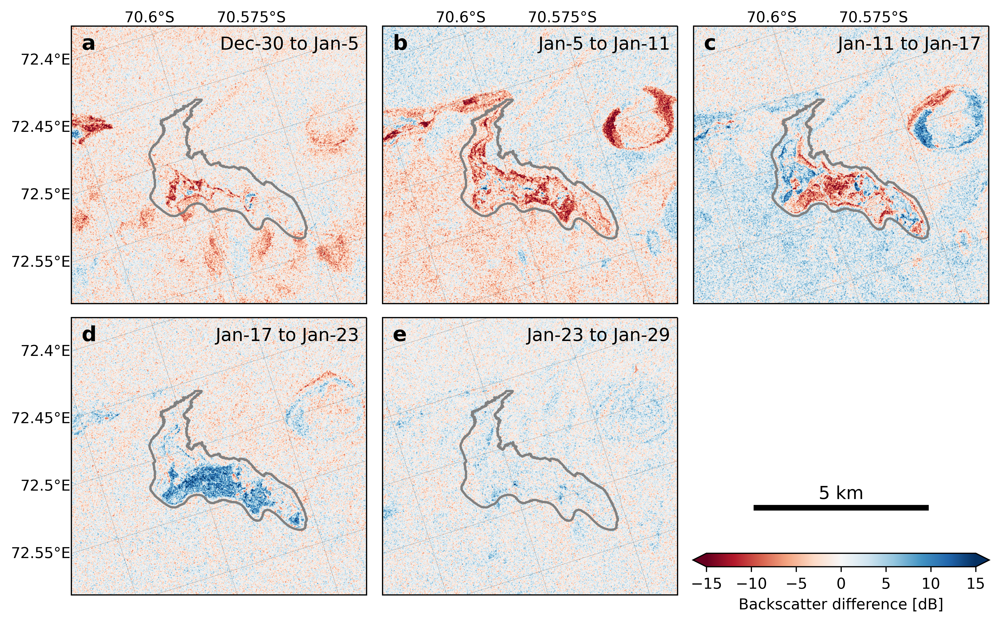

In [4]:
# create panel lables
subplot_labels = ['a', 'b', 'c', 'd', 'e', '']

# create a figure
fig = plt.figure(figsize=(11,7))

# create subplot axes
ax = [fig.add_subplot(2,3,i+1, 
                      projection=ccrs.Stereographic(central_latitude=-90.0, 
                                                    central_longitude=0, 
                                                    true_scale_latitude=-71, 
                                                    globe=None)) for i in range(6)]

# loop through melt season and plot
for i in range(len(ax)):
    
    # set axis
    a = ax[i]
    
    # if it's the last plot, make blank, otherwise plot
    if i==len(ax)-1:
        # turn off 6th plot, and in its place add a colorbar and scale bar
        a.axis('off') 

        fontprops = fm.FontProperties(size=12)
        scalebar = AnchoredSizeBar(ax[0].transData,
               5000, '5 km', 'lower center', 
               pad=0,
               label_top=True,                    
               color='black',
               frameon=False,
               size_vertical=120,
               fontproperties=fontprops)

        a.add_artist(scalebar)
        
        plt.colorbar(s1, extend='both', orientation='horizontal', label='Backscatter difference [dB]')

    else:
    
        # difference the pair of s1 images
        da = rxr.open_rasterio('ron3/' + s1_subset[i])
        da2 = rxr.open_rasterio('ron3/' + s1_subset[i+1])
        diff = da2-da

        print(s1_subset[i])

        # plot s1 difference
        s1 = diff[0].plot.pcolormesh(vmin=-15, vmax=15, cmap='RdBu', ax=a, add_colorbar=False, add_labels=False)
        
        # plot shoreline
        sl = shoreline.plot(ax=a, color='gray')

        a.set_ylim([635500, 643500])
        a.set_xlim([2.0255e6, 2.034e6])

#         a.set_extent([72.58,72.45,-70.565,-70.62], crs=ccrs.PlateCarree())
        gl = a.gridlines(crs=ccrs.PlateCarree(), draw_labels=False, linestyle='--', linewidth=0.2, color='gray', y_inline=False, x_inline=False)

        gl.xlocator = mticker.FixedLocator([72.6, 72.55, 72.5, 72.45, 72.4])
        gl.ylocator = mticker.FixedLocator([-70.575, -70.6, -70.625])
        
        gl.xlabel_style = {'rotation':0}
        gl.ylabel_style = {'rotation':0}

        # Add labels to panel
        a.annotate(subplot_labels[i], xy=(0.035, 0.915), xycoords='axes fraction', size=14, weight='bold')
        
        # get dates and add to panel
        date1 = datetime(int(s1_subset[i][17:21]),int(s1_subset[i][21:23]),int(s1_subset[i][23:25]))
        date2 = datetime(int(s1_subset[i+1][17:21]),int(s1_subset[i+1][21:23]),int(s1_subset[i+1][23:25]))
        datelabel = date1.strftime("%b") + '-' + str(date1.day) + ' to ' + date2.strftime("%b") + '-' + str(date2.day)
        a.annotate(datelabel, xy=(0.975, 0.915), xycoords='axes fraction', size=12, ha='right')
        
        if i==0:
            gl.left_labels=True
            gl.top_labels=True
            gl.right_labels=False
            gl.bottom_labels=False
            
        elif i==3:
            gl.left_labels=True
            gl.top_labels=False
            gl.right_labels=False
            gl.bottom_labels=False
            
        elif i==4:
            gl.left_labels=False
            gl.top_labels=False
            gl.right_labels=False
            gl.bottom_labels=False            
        
        else:
            gl.left_labels=False
            gl.top_labels=True
            gl.right_labels=False
            gl.bottom_labels=False

# manually make this a bit tighter of a plot (height space and width space)
fig.subplots_adjust(wspace=0.05, hspace=0.05)

plt.savefig('Fig4_AmeryLakeDrain.png')

plt.show()